In [40]:
# Import libraries

import cv2
from plantcv import plantcv as pcv


In [63]:
class options:
    def __init__(self,img_nbr=0):
        self.image = "../data/raw/"+str(img_nbr)+".jpg"
        self.debug = "plot"
        self.writeimg= False 
        self.outdir = "."

# Get options
args = options(3)

# Set debug to the global parameter 
pcv.params.debug = args.debug


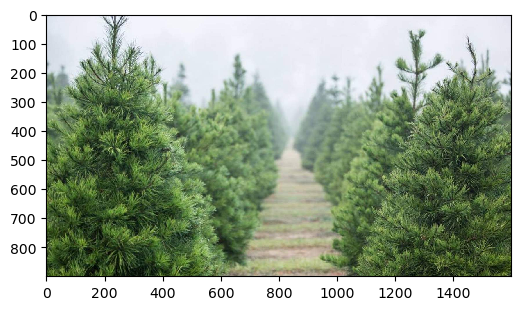

In [64]:
# Read image 

# Inputs:
#   filename - Image file to be read in 
#   mode - Return mode of image; either 'native' (default), 'rgb', 'gray', or 'csv' 
img, path, filename = pcv.readimage(filename=args.image)

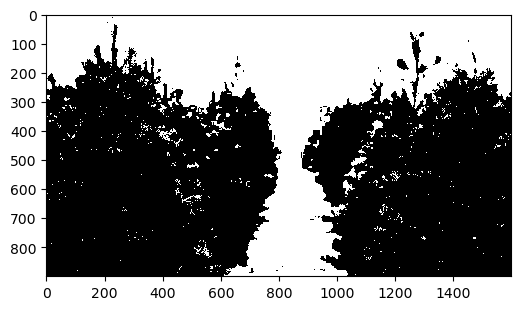

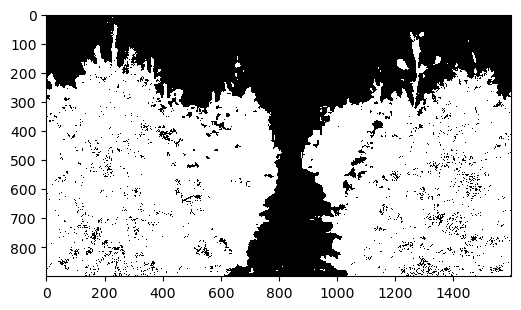

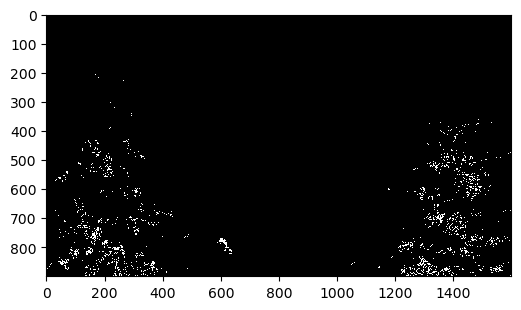

In [65]:
# Use the output file from `plantcv-train.py` to run the multiclass 
# naive bayes classification on the image. The function below will 
# print out 4 masks (plant, pustule, chlorosis, background)

# Inputs: 
#   rgb_img - RGB image data 
#   pdf_file - Output file containing PDFs from `plantcv-train.py`
mask = pcv.naive_bayes_classifier(rgb_img=img, 
                                  pdf_file="../data/processed/naive_bayes_pdfs.txt")

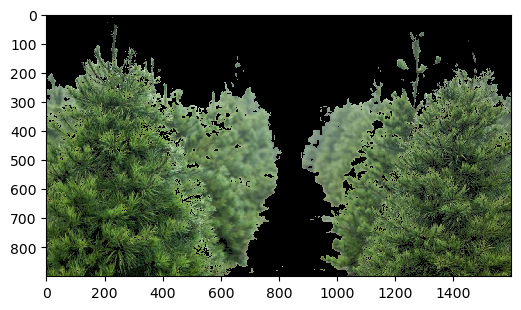

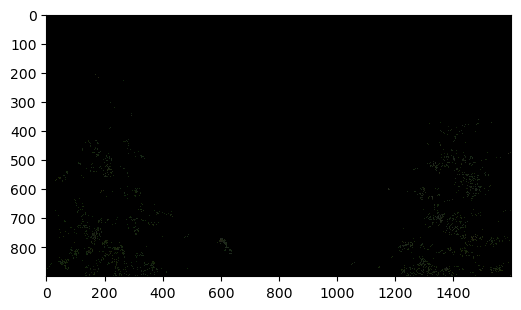

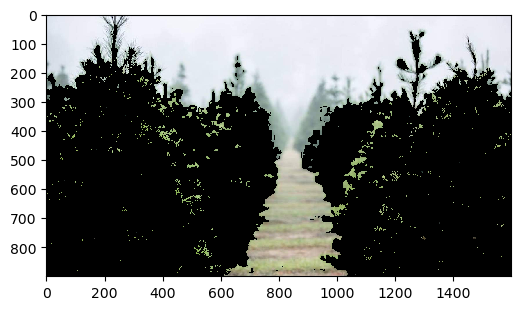

In [66]:
# We can apply each mask to the original image to more accurately 
# see what got masked

# Inputs:
#   rgb_img - RGB image data 
#   mask - Binary mask image data 
#   mask_color - 'white' or 'black' 
plant_img = pcv.apply_mask(mask=(mask['Arbre']), img=img, mask_color='black')
pustule_img = pcv.apply_mask(mask=(mask['tronc']), img=img, mask_color='black')
background_img = pcv.apply_mask(mask=(mask['background']), img=img, mask_color='black')

In [36]:
f1 = open("../data/processed/rgb_classes.txt",'r')
f2 = open("../data/processed/background_rbg.txt",'r')
lines_f1 = [line for line in f1]
lines_f2 = [line.strip('\n') for line in f2]
lines_outp = []
i=0
for lf1 in lines_f1:
    lines_outp.append(lines_f2[i]+"\t"+lf1)
    i+=1
for j in range(i,len(lines_f2)):
    lines_outp.append(lines_f2[j]+"\n")


In [37]:
output = ''.join(lines_outp)

In [38]:
f_out = open("../data/processed/rgb_3classes.txt","w")
f_out.write(output)
f_out.close()
f1.close()
f2.close()

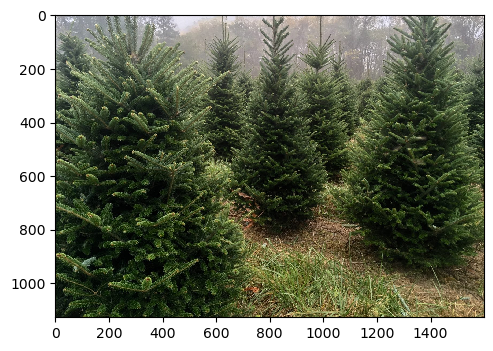

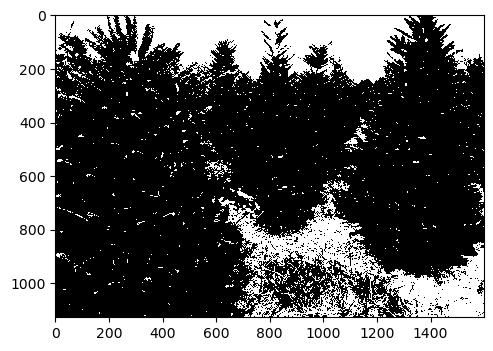

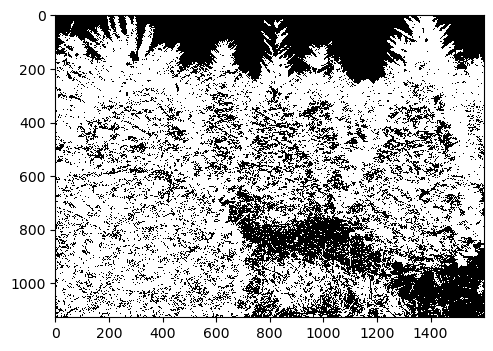

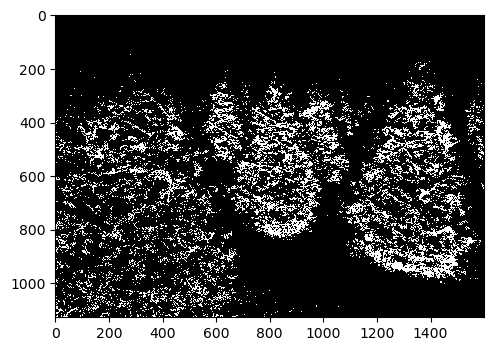

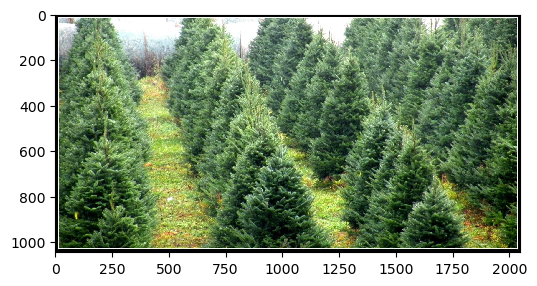

...

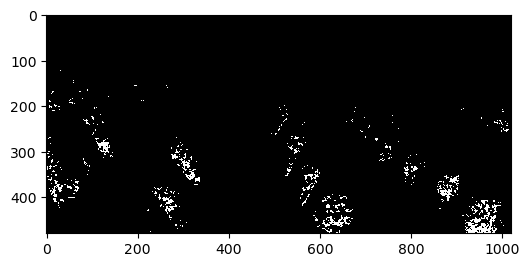

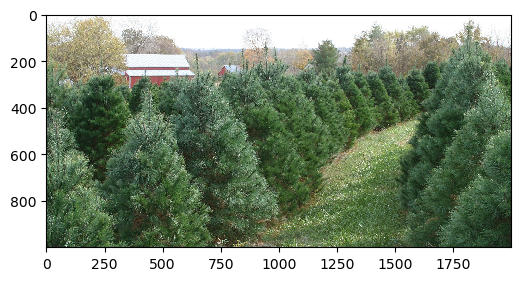

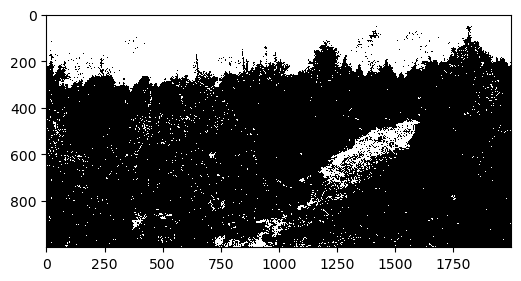

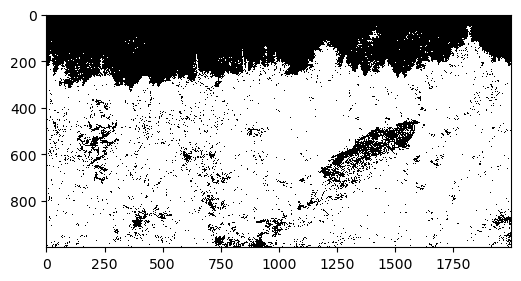

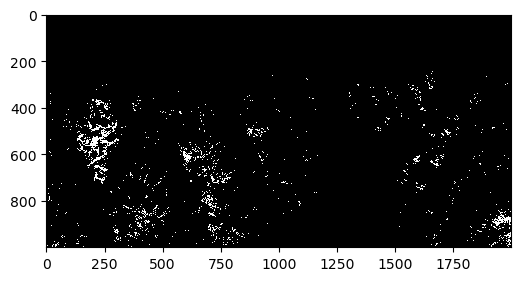

In [73]:
maskslist = []
for i in range(18):
#     input("next image is "+str(i))
    # Get options
    args = options(i)

    # Set debug to the global parameter 
    pcv.params.debug = args.debug
    # Read image 

    # Inputs:
    #   filename - Image file to be read in 
    #   mode - Return mode of image; either 'native' (default), 'rgb', 'gray', or 'csv' 
    img, path, filename = pcv.readimage(filename=args.image)
    mask = pcv.naive_bayes_classifier(rgb_img=img, 
                                  pdf_file="../data/processed/naive_bayes_pdfs.txt")
    maskslist.append(mask)
    

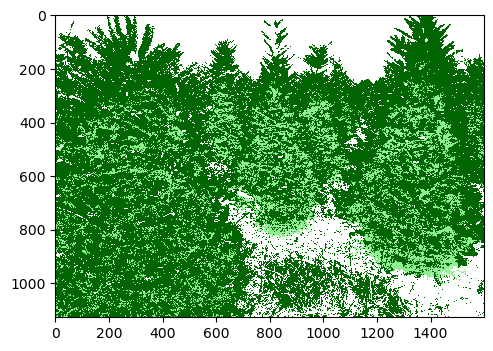

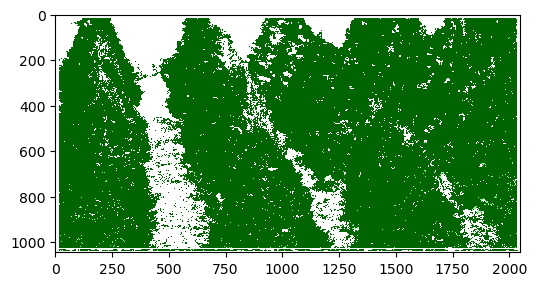

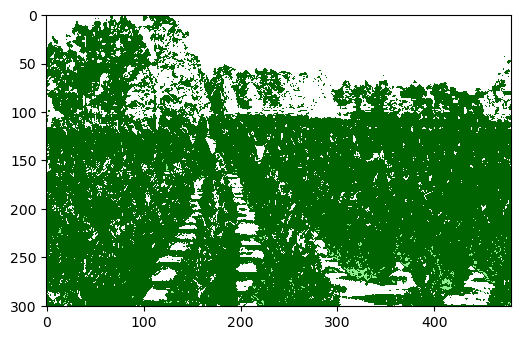

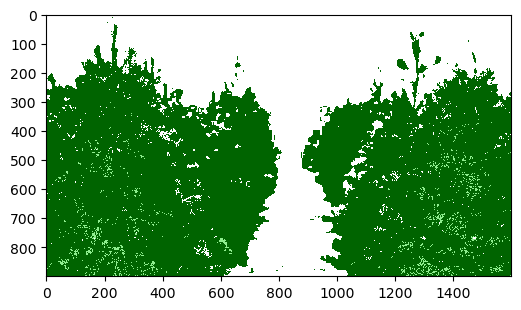

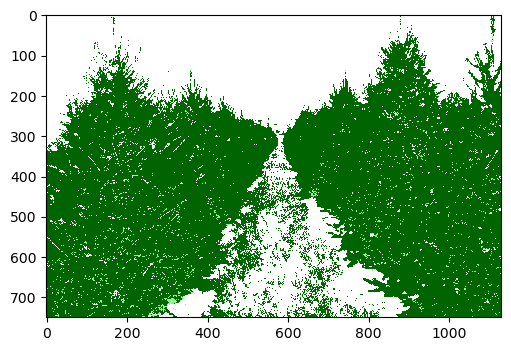

...

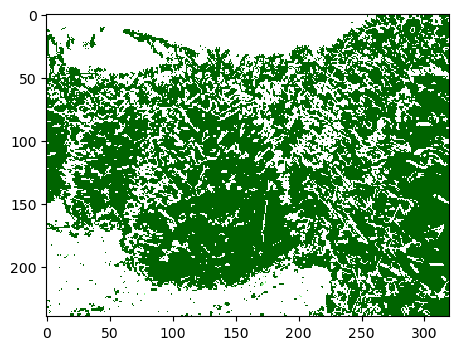

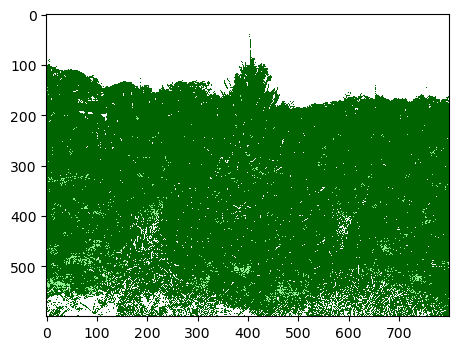

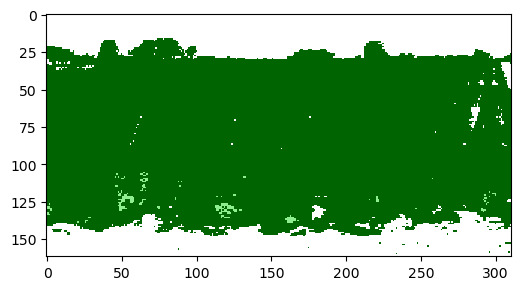

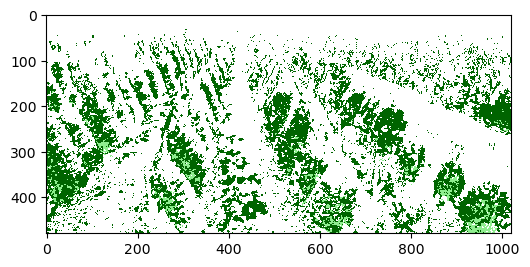

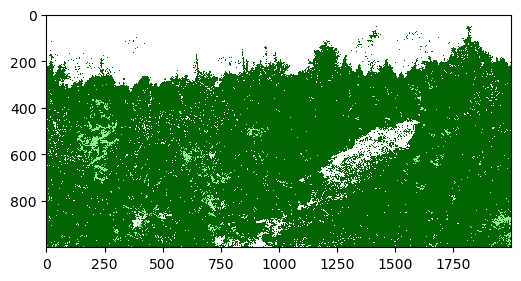

In [85]:
for i in range(18):
    mask = maskslist[i]
    f = pcv.visualize.colorize_masks(masks=[mask['Arbre'], mask['tronc'], mask['background']], 
                                              colors=['dark green', 'light green', 'white'])

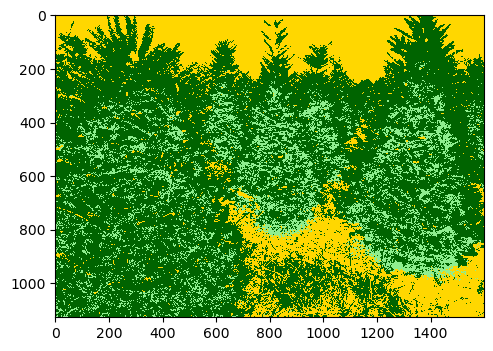

array([[[  0, 215, 255],
        [  0, 215, 255],
        [  0, 215, 255],
        ...,
        [  0, 215, 255],
        [  0, 215, 255],
        [  0, 215, 255]],

       [[  0, 215, 255],
        [  0, 215, 255],
        [  0, 215, 255],
        ...,
        [  0, 215, 255],
        [  0, 215, 255],
        [  0, 215, 255]],

       [[  0, 215, 255],
        [  0, 215, 255],
        [  0, 215, 255],
        ...,
        [  0, 215, 255],
        [  0, 215, 255],
        [  0, 215, 255]],

       ...,

       [[143, 238, 143],
        [143, 238, 143],
        [143, 238, 143],
        ...,
        [  0, 215, 255],
        [  0, 215, 255],
        [  0, 215, 255]],

       [[143, 238, 143],
        [143, 238, 143],
        [143, 238, 143],
        ...,
        [  0, 215, 255],
        [  0, 215, 255],
        [  0, 215, 255]],

       [[143, 238, 143],
        [  0, 100,   0],
        [  0, 100,   0],
        ...,
        [  0, 215, 255],
        [  0, 215, 255],
        [  0, 215, 255]]

In [83]:
pcv.visualize.colorize_masks(masks=[mask['Arbre'], mask['tronc'], mask['background']], 
                                              colors=['dark green', 'light green', 'gold'])